In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ipywidgets import interact
from tqdm.notebook import tqdm
from sklearn.metrics import f1_score, accuracy_score, balanced_accuracy_score, confusion_matrix
from scipy import signal
from scipy.fftpack import fft
import math

# Data

In [2]:
train_x = np.load('data/0_x_train.npy')
test_x  = np.load('data/0_x_test.npy')
train_y = np.load('data/1_linear_preds_train.npy')
test_y  = np.load('data/1_linear_preds_test.npy')

train_noise_real = np.load('data/2_noise_real_train.npy')
train_noise_linPred = np.load('data/2_noise_linPred_train.npy')
test_noise_linPred  = np.load('data/2_noise_linPred_test.npy')

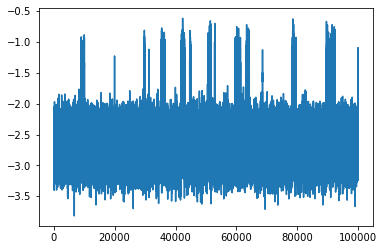

In [3]:
plt.plot(test_x[:100000])

# Ver frecuencias de 50 hz en noise 

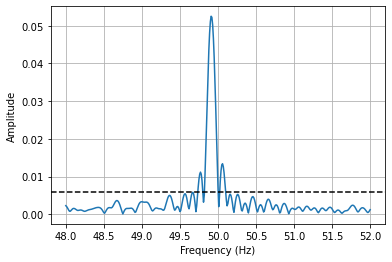

In [4]:
def fourier(signal, freq_muestreo, limit_freqs=None, res=1, plot=False, title=""):
    N = len(signal) * res
    T = 1.0 / freq_muestreo
    
    freqs = np.linspace(0.0, 1.0/(2.0*T), N//2) # xfft
    yfft  = fft(signal, n=N)[:N//2]
    ampls = 2.0/len(signal) * np.abs(yfft)
    fases = np.angle(yfft) + math.pi/2 # NO SE PQ el + math.pi/2 !!!!!!!!!!!!!
    #print(len(freqs), len(np.abs(ampls)),len(fases))
    
    threshold = ampls.std() * 8
    
    #for f,a in zip(freqs,ampls):
    #    if a>threshold: print(f)
        
    if limit_freqs:
        lowFreq,topFreq = limit_freqs
        freqs = freqs[math.floor(lowFreq * T * N):math.ceil(topFreq * T * N)]
        ampls = ampls[math.floor(lowFreq * T * N):math.ceil(topFreq * T * N)]
        fases = fases[math.floor(lowFreq * T * N):math.ceil(topFreq * T * N)]
        
    if plot:
        #plt.figure(figsize=(16, 4))
        plt.plot(freqs, ampls)
        plt.title(title)
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Amplitude")
        plt.axhline(threshold, color='k', linestyle='--')
        plt.grid()
        plt.show()
        
    return freqs, ampls, fases

fourier(train_noise_real[:100000], freq_muestreo=10000, limit_freqs=(48,52),  res=10, plot=True);

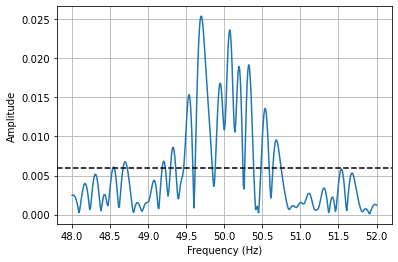

In [5]:
fourier(train_noise_real[3100000:3200000], freq_muestreo=10000, limit_freqs=(48,52), res=10, plot=True);

In [6]:
def wave(freq, ampl, phase, n_points):
    #return ampl * np.sin( np.arange(n_points)*freq + phase)
    return ampl * np.sin( np.arange(n_points)* 2 * math.pi / 10000 * freq + phase)

## Buscar las ondas de 50Hz en noise TRAIN con la transformada de Fourier

In [7]:
waves_50hz_train = np.array([])
for i, noise_i in enumerate(np.split(train_noise_real, 10)):
    if i in [2,4,6,9]: num_segments = 50
    else: num_segments = 5
    
    for j, noise_segment in enumerate(np.split(noise_i, num_segments)):
        
        freqs, ampls, fases = fourier(noise_segment, freq_muestreo=10000, limit_freqs=(48,52), res=100, plot=False);
    
        freq = freqs[ampls.argmax()]
        ampl = ampls[ampls.argmax()]
        fase = fases[ampls.argmax()]

        waves_50hz_train = np.append(waves_50hz_train, wave(freq, ampl, fase, len(noise_segment)))
        print("Segment:",i,j+1,"\tfreq:",round(freq,4),"\tampl:",round(ampl,4),"\tphase:",round(fase,4))

Segment: 0 1 	freq: 49.913 	ampl: 0.0526 	phase: 4.4699
Segment: 0 2 	freq: 50.114 	ampl: 0.0557 	phase: 0.4288
Segment: 0 3 	freq: 50.14 	ampl: 0.0551 	phase: 3.1312
Segment: 0 4 	freq: 50.115 	ampl: 0.0569 	phase: 1.9956
Segment: 0 5 	freq: 49.946 	ampl: 0.0568 	phase: 2.8192
Segment: 1 1 	freq: 49.935 	ampl: 0.049 	phase: 4.2279
Segment: 1 2 	freq: 49.924 	ampl: 0.0534 	phase: 0.7088
Segment: 1 3 	freq: 49.966 	ampl: 0.0535 	phase: 0.2674
Segment: 1 4 	freq: 50.037 	ampl: 0.0545 	phase: 1.2908
Segment: 1 5 	freq: 49.894 	ampl: 0.0547 	phase: 4.5754
Segment: 2 1 	freq: 50.0401 	ampl: 0.0557 	phase: -1.2357
Segment: 2 2 	freq: 50.0301 	ampl: 0.0521 	phase: 1.9151
Segment: 2 3 	freq: 50.0401 	ampl: 0.0489 	phase: 0.6616
Segment: 2 4 	freq: 50.0201 	ampl: 0.0509 	phase: 1.9769
Segment: 2 5 	freq: 50.0001 	ampl: 0.0502 	phase: 4.5935
Segment: 2 6 	freq: 49.9901 	ampl: 0.0531 	phase: 3.5954
Segment: 2 7 	freq: 49.9401 	ampl: 0.0527 	phase: 0.8456
Segment: 2 8 	freq: 50.0201 	ampl: 0.0526 

Segment: 6 24 	freq: 50.0601 	ampl: 0.0534 	phase: -1.459
Segment: 6 25 	freq: 50.0601 	ampl: 0.055 	phase: 4.4051
Segment: 6 26 	freq: 49.9701 	ampl: 0.0569 	phase: 2.1802
Segment: 6 27 	freq: 49.9301 	ampl: 0.061 	phase: 4.3184
Segment: 6 28 	freq: 49.9901 	ampl: 0.0537 	phase: -0.0819
Segment: 6 29 	freq: 50.0401 	ampl: 0.0515 	phase: 2.785
Segment: 6 30 	freq: 49.9601 	ampl: 0.0555 	phase: 4.0661
Segment: 6 31 	freq: 50.0301 	ampl: 0.0523 	phase: 2.9887
Segment: 6 32 	freq: 50.0101 	ampl: 0.0558 	phase: 0.7484
Segment: 6 33 	freq: 50.0101 	ampl: 0.0538 	phase: 0.5536
Segment: 6 34 	freq: 49.9801 	ampl: 0.0539 	phase: 3.5388
Segment: 6 35 	freq: 49.9801 	ampl: 0.0547 	phase: -1.4096
Segment: 6 36 	freq: 49.9401 	ampl: 0.0541 	phase: 1.0082
Segment: 6 37 	freq: 49.9901 	ampl: 0.0545 	phase: 0.3559
Segment: 6 38 	freq: 49.9101 	ampl: 0.0539 	phase: 2.4187
Segment: 6 39 	freq: 50.0301 	ampl: 0.0537 	phase: 3.1004
Segment: 6 40 	freq: 50.0501 	ampl: 0.0555 	phase: 2.1696
Segment: 6 41 	

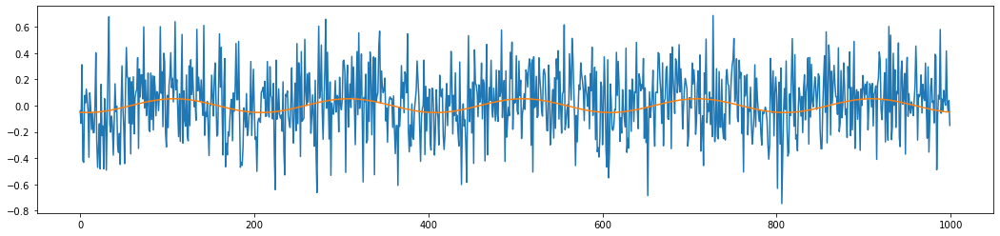

In [8]:
plt.figure(figsize=(18, 4))
plt.plot(train_noise_real[:1000]);
plt.plot(waves_50hz_train[:1000]);

## Buscar las ondas de 50Hz en noise TEST con la transformada de Fourier

In [9]:
waves_50hz_test = np.array([])
for i, noise_i in enumerate(np.split(test_noise_linPred, 20)):
    if i in [4]: num_segments = 10
    else: num_segments = 1
    
    for j, noise_segment in enumerate(np.split(noise_i, num_segments)):
        
        freqs, ampls, fases = fourier(noise_segment, freq_muestreo=10000, limit_freqs=(48,52), res=100, plot=False);
    
        freq = freqs[ampls.argmax()]
        ampl = ampls[ampls.argmax()]
        fase = fases[ampls.argmax()]
        
        if ampl<0.05: ampl=0.05

        waves_50hz_test = np.append(waves_50hz_test, wave(freq, ampl, fase, len(noise_segment)))
        print("Segment:",i,j+1,"\tfreq:",round(freq,4),"\tampl:",round(ampl,4),"\tphase:",round(fase,4))

Segment: 0 1 	freq: 50.065 	ampl: 0.0529 	phase: 1.1908
Segment: 1 1 	freq: 49.918 	ampl: 0.0516 	phase: 4.2016
Segment: 2 1 	freq: 50.156 	ampl: 0.053 	phase: 3.5155
Segment: 3 1 	freq: 49.986 	ampl: 0.05 	phase: 1.7163
Segment: 4 1 	freq: 50.0401 	ampl: 0.05 	phase: 2.9438
Segment: 4 2 	freq: 49.9501 	ampl: 0.05 	phase: 2.6082
Segment: 4 3 	freq: 50.0101 	ampl: 0.05 	phase: 4.5719
Segment: 4 4 	freq: 49.9201 	ampl: 0.05 	phase: 3.697
Segment: 4 5 	freq: 50.0101 	ampl: 0.05 	phase: 1.3633
Segment: 4 6 	freq: 50.0101 	ampl: 0.0523 	phase: 0.9226
Segment: 4 7 	freq: 49.9801 	ampl: 0.05 	phase: 0.1266
Segment: 4 8 	freq: 49.9601 	ampl: 0.05 	phase: 0.3302
Segment: 4 9 	freq: 50.0001 	ampl: 0.0517 	phase: 3.2039
Segment: 4 10 	freq: 49.9801 	ampl: 0.05 	phase: 0.3889
Segment: 5 1 	freq: 49.895 	ampl: 0.05 	phase: 0.9978
Segment: 6 1 	freq: 49.923 	ampl: 0.05 	phase: -0.0629
Segment: 7 1 	freq: 49.962 	ampl: 0.05 	phase: 2.2292
Segment: 8 1 	freq: 49.938 	ampl: 0.05 	phase: -0.9058
Segment

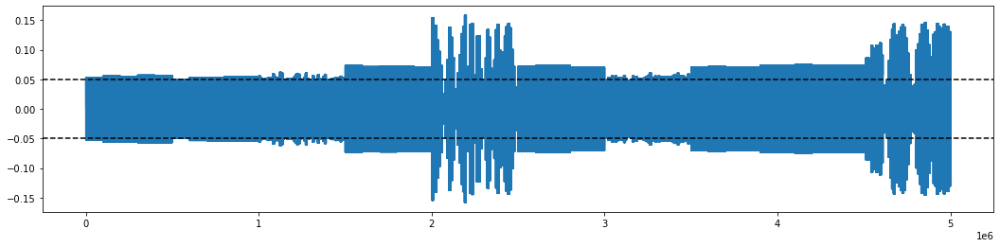

In [10]:
plt.figure(figsize=(18, 4)); plt.plot(waves_50hz_train);
plt.axhline(0.05, color='k', linestyle='--')
plt.axhline(-0.05, color='k', linestyle='--');

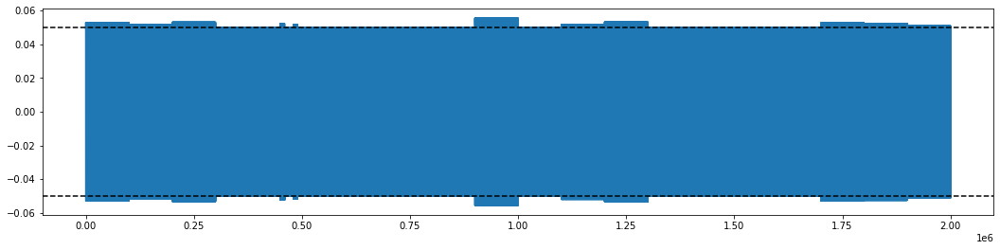

In [11]:
plt.figure(figsize=(18, 4)); plt.plot(waves_50hz_test);
plt.axhline(0.05, color='k', linestyle='--')
plt.axhline(-0.05, color='k', linestyle='--');

# Comparar

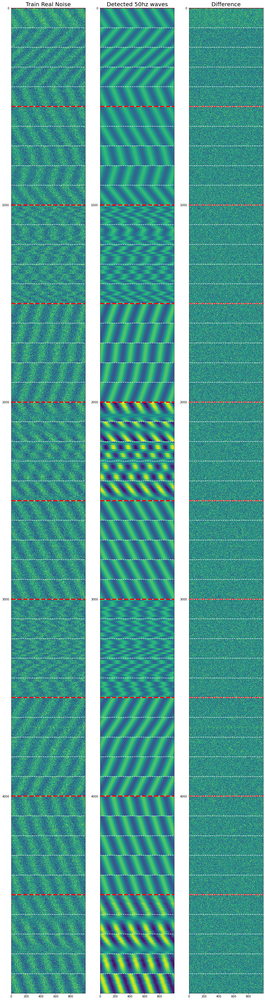

In [12]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16, 64))

ax[0].imshow(train_noise_real.reshape(-1, 1000).clip(-0.05,0.05), aspect='auto')
#[ax[0].axhline(i, color='k', linestyle='--') for i in range(1000,1500,10)]
#[ax[0].axhline(i, color='k', linestyle='--') for i in range(2000,2500,50)]
#[ax[0].axhline(i, color='k', linestyle='--') for i in range(3000,3500,10)]
#[ax[0].axhline(i, color='k', linestyle='--') for i in range(4500,5000,50)]
[ax[0].axhline(i, color='w', linestyle='--') for i in range(0,5000,100)]
[ax[0].axhline(i, color='r', linestyle='--', linewidth=4) for i in range(0,5000,500)]
ax[0].set_title("Train Real Noise", fontsize=20);

ax[1].imshow(waves_50hz_train.reshape(-1, 1000), aspect='auto')
[ax[1].axhline(i, color='w', linestyle='--') for i in range(0,5000,100)]
[ax[1].axhline(i, color='r', linestyle='--', linewidth=4) for i in range(0,5000,500)]
ax[1].set_title("Detected 50hz waves", fontsize=20);

train_diff = train_noise_real - waves_50hz_train
ax[2].imshow(train_diff.reshape(-1, 1000).clip(-0.02,0.02), aspect='auto')
[ax[2].axhline(i, color='r', linestyle='--', linewidth=4) for i in range(0,5000,500)]
[ax[2].axhline(i, color='w', linestyle='--') for i in range(0,5000,100)]
ax[2].set_title("Difference", fontsize=20);

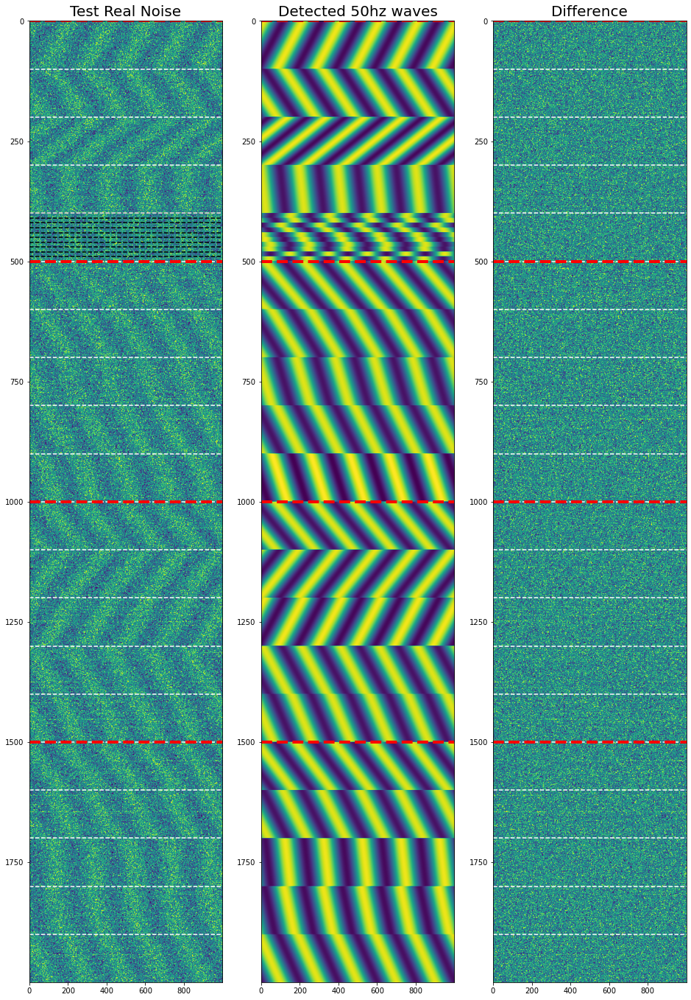

In [13]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16, 24))

ax[0].imshow(test_noise_linPred.reshape(-1, 1000).clip(-0.02,0.02), aspect='auto')
[ax[0].axhline(i, color='k', linestyle='--') for i in range(400,500,10)]
[ax[0].axhline(i, color='w', linestyle='--') for i in range(0,2000,100)]
[ax[0].axhline(i, color='r', linestyle='--', linewidth=4) for i in range(0,2000,500)]
ax[0].set_title("Test Real Noise", fontsize=20);

ax[1].imshow(waves_50hz_test.reshape(-1, 1000), aspect='auto')
[ax[1].axhline(i, color='r', linestyle='--', linewidth=4) for i in range(0,2000,500)]
ax[1].set_title("Detected 50hz waves", fontsize=20);

test_diff = test_noise_linPred - waves_50hz_test
ax[2].imshow(test_diff.reshape(-1, 1000).clip(-0.02,0.02), aspect='auto')
[ax[2].axhline(i, color='w', linestyle='--') for i in range(0,2000,100)]
[ax[2].axhline(i, color='r', linestyle='--', linewidth=4) for i in range(0,2000,500)]
ax[2].set_title("Difference", fontsize=20);

# Guardar 50 Hz

In [14]:
#np.save('data/3_50hz_train.npy', waves_50hz_train)
#np.save('data/3_50hz_test.npy', waves_50hz_test)

# Guardar x - 50 Hz

In [16]:
np.save('data/3_x_sin_50hz_train.npy', train_x - waves_50hz_train)
np.save('data/3_x_sin_50hz_test.npy', test_x - waves_50hz_test)